In [1]:
# Import packages

import re, nltk, spacy, string

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from pprint import pprint

import pyLDAvis
import pyLDAvis.sklearn
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import seaborn as sns

import os
import glob
import pandas as pd
import pickle
import heapq
import itertools
from sklearn.metrics.pairwise import linear_kernel

os.chdir('/home/matthew/anaconda3/envs/insight/staycationLA/notebooks')

/home/matthew/anaconda3/envs/insight/lib/python3.8/site-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.9 it will stop working
  from collections import Iterable
/home/matthew/anaconda3/envs/insight/lib/python3.8/site-packages/past/builtins/misc.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.9 it will stop working
  from collections import Mapping


In [2]:
#modified from 
#https://towardsdatascience.com/topic-modeling-quora-questions-with-lda-nmf-aff8dce5e1dd
#https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0
#https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0
#https://medium.com/@yanlinc/how-to-build-a-lda-topic-model-using-from-text-601cdcbfd3a6

In [2]:
#load data from NB01 scrape international city reviews
cities2 = pd.read_csv("../data/processed/cities_final_corpora.csv", index_col=None)
cities2

,city,english
0,istanbul,many place visit i ̇ capital city empire many ...
1,beijing,beijing good place learn happen travel sunday ...
2,phuket,must see last november rain cat dog pick day t...
3,santorini,christ modern times island perfect place spend...
4,cusco,cusco place cisco nice clean town architecture...
5,sydney,good thing warm sunny day coast walk city surr...
6,florence,great overview city great value see important ...
7,jaipur,pashmina shop visit friend mine beautiful pas...
8,luxor,luxor tour temple luxor valley king amazing ca...
9,marrakech,half half although part enjoy holiday glad go ...


In [3]:
#load data from NB04 LA attraction reviews combine
LA = pd.read_csv("../data/processed/LA_final_corpora.csv", index_col=None)
LA

,attraction,english,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,Universal_Studios_Hollywood,front line must family universal orlando la do...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.138416', '-118.35337')]",http://www.universalstudioshollywood.com/,Theme Parks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,36470,#1
1,Griffith_Observatory,griffith observatory another must see landmark...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.118492', '-118.30039')]",http://www.griffithobservatory.org/,Observatories & Planetariums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,20247,#2
2,Santa_Monica_Pier,end mother road must trip la pier iconic part ...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('34.01038', '-118.49594')]",http://santamonicapier.org/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,18866,#3
3,Hollywood_Walk_of_Fame,exciting crowded walk street hollywood think s...,https://www.tripadvisor.com/Attraction_Review-...,3.5,"[('34.1016', '-118.32672')]",http://www.walkoffame.com/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,17542,#4
4,The_Getty_Center,accidentally press wrong key get review page d...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.077564', '-118.474625')]",http://www.getty.edu/visit/center,Specialty Museums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,14503,#5
...,...,...,...,...,...,...,...,...,...,...,...
1330,Public_Art_You_Are_Not_Forgotten,powerful block inland beach art installation w...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1331,Mulholland_Memorial_Fountain,bring water city dry apt monument man remarkab...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1332,Hermit_Falls,hermit fall go lot close house easy take santa...,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269
1333,Ancient_Thai_Massage_and_Spa,great place de stress love go place area go ye...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269


In [4]:
LA.dropna(subset=['attraction'], inplace=True)
LA

,attraction,english,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,Universal_Studios_Hollywood,front line must family universal orlando la do...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.138416', '-118.35337')]",http://www.universalstudioshollywood.com/,Theme Parks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,36470,#1
1,Griffith_Observatory,griffith observatory another must see landmark...,https://www.tripadvisor.com/Attraction_Review-...,4.5,"[('34.118492', '-118.30039')]",http://www.griffithobservatory.org/,Observatories & Planetariums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,20247,#2
2,Santa_Monica_Pier,end mother road must trip la pier iconic part ...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('34.01038', '-118.49594')]",http://santamonicapier.org/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,18866,#3
3,Hollywood_Walk_of_Fame,exciting crowded walk street hollywood think s...,https://www.tripadvisor.com/Attraction_Review-...,3.5,"[('34.1016', '-118.32672')]",http://www.walkoffame.com/,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,17542,#4
4,The_Getty_Center,accidentally press wrong key get review page d...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.077564', '-118.474625')]",http://www.getty.edu/visit/center,Specialty Museums,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,14503,#5
...,...,...,...,...,...,...,...,...,...,...,...
1330,Public_Art_You_Are_Not_Forgotten,powerful block inland beach art installation w...,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1331,Mulholland_Memorial_Fountain,bring water city dry apt monument man remarkab...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1,#269
1332,Hermit_Falls,hermit fall go lot close house easy take santa...,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269
1333,Ancient_Thai_Massage_and_Spa,great place de stress love go place area go ye...,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1,#269


In [5]:
combo = pd.concat([cities2, LA], axis=0)
combo

,city,english,attraction,TA_url,rating,gps,url,type,name,pic,num_reviews,ranking
0,istanbul,many place visit i ̇ capital city empire many ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,beijing,beijing good place learn happen travel sunday ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,phuket,must see last november rain cat dog pick day t...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,santorini,christ modern times island perfect place spend...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cusco,cusco place cisco nice clean town architecture...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1330,NaN,powerful block inland beach art installation w...,Public_Art_You_Are_Not_Forgotten,https://www.tripadvisor.com/Attraction_Review-...,4.0,"[('33.99334', '-118.47675')]",https://www.tripadvisor.com/Attractions-g32655...,Art Galleries,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1.0,#269
1331,NaN,bring water city dry apt monument man remarkab...,Mulholland_Memorial_Fountain,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.117', '-118.27169')]",http://waterandpower.org/museum/Mulholland_Mon...,Points of Interest & Landmarks,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='https://dynam...,1.0,#269
1332,NaN,hermit fall go lot close house easy take santa...,Hermit_Falls,https://www.tripadvisor.com/Attraction_Review-...,5.0,[],https://www.tripadvisor.com/Attraction_Review-...,Waterfalls,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1.0,#269
1333,NaN,great place de stress love go place area go ye...,Ancient_Thai_Massage_and_Spa,https://www.tripadvisor.com/Attraction_Review-...,5.0,"[('34.02695', '-117.89633')]",http://ancientthaispamassage.com/,Spas,<a href='https://www.tripadvisor.com/Attracti...,<img class='img-responsive' src='nan'>,1.0,#269


In [6]:
#find how many characters are in corpora for each city
combo['english'] = combo['english'].astype(str)
print (combo['english'].head(30).apply(lambda x: len(x)))

0      484951
1      379942
2      149423
3      213584
4      147182
5      147854
6      344863
7       74538
8      277567
9      224624
10     142115
11     115778
12     273567
13     219368
14     134905
15     214723
16     190341
17     217007
18     114141
19     166524
20     197993
21      99525
22      76257
23     169557
0     2617641
1     1070716
2     1280868
3      645862
4     2136082
5      816969
Name: english, dtype: int64


In [7]:
combo = combo.reset_index(drop=True)

# Get names of indexes for attractions with only 1 review
indexNames = combo[ combo['num_reviews'] == 1 ].index
# Delete these row indexes from dataFrame
combo.drop(indexNames , inplace=True)
# Get names of indexes for attractions with only 2 review
indexNames = combo[ combo['num_reviews'] == 2 ].index
# Delete these row indexes from dataFrame
combo.drop(indexNames , inplace=True)

combo = combo.reset_index(drop=True)
#truncate strings longer than 75,000 characters so that the international cities are weighted equally with the most popular LA attractions
combo['english2'] = combo['english'].str.slice(0, 75000)
len(combo)

1071

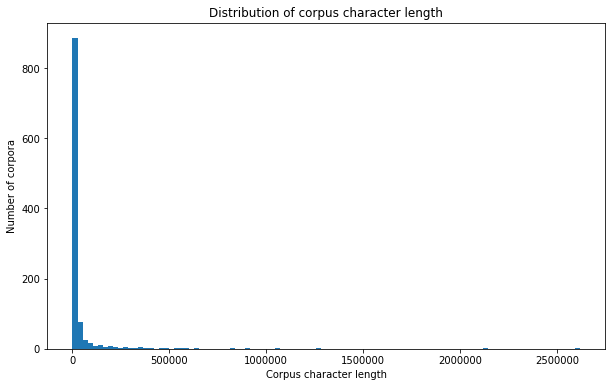

In [119]:
plt.figure(figsize=(10,6))
doc_lens = [len(d) for d in combo.english]
plt.hist(doc_lens, bins = 100)
plt.title('Distribution of corpus character length')
plt.ylabel('Number of corpora')
plt.xlabel('Corpus character length')
#sns.despine()
plt.show()

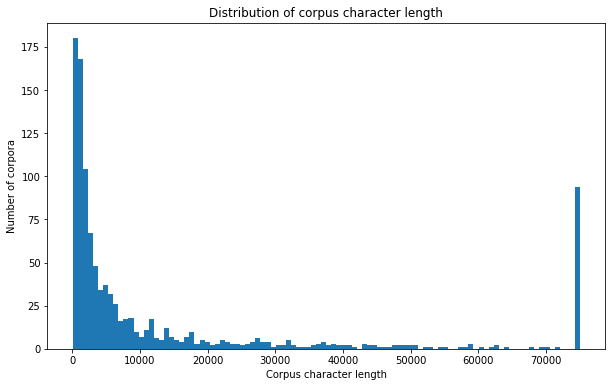

In [120]:
plt.figure(figsize=(10,6))
doc_lens = [len(d) for d in combo.english2]
plt.hist(doc_lens, bins = 100)
plt.title('Distribution of corpus character length')
plt.ylabel('Number of corpora')
plt.xlabel('Corpus character length')
#sns.despine()
plt.show()
#lower number of character length at 0 indicates removal of rows with 0 reviews

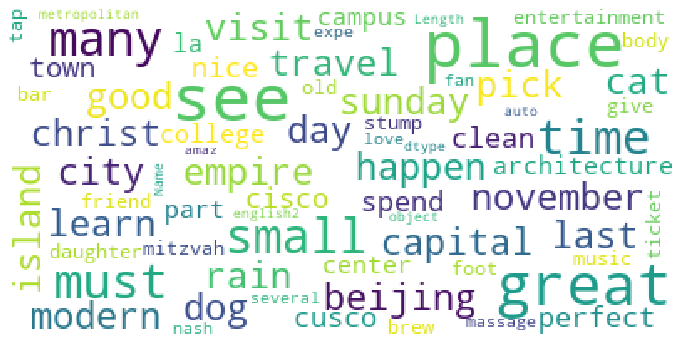

In [121]:

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

mpl.rcParams['figure.figsize']=(12.0,12.0)  
mpl.rcParams['font.size']=12            
mpl.rcParams['savefig.dpi']=100             
mpl.rcParams['figure.subplot.bottom']=.1 
stopwords = set(STOPWORDS)

wordcloud = WordCloud(
                          background_color='white',
                          stopwords=stopwords,
                          max_words=500,
                          max_font_size=40, 
                          random_state=42
                         ).generate(str(combo['english2']))

print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show();

In [122]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [123]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english', max_df = 0.4).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [129]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english', max_df = 0.3).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(combo['english2'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [13]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(combo['english2'], 20)
df3 = pd.DataFrame(common_words, columns = ['bigram' , 'count'])

fig = go.Figure([go.Bar(x=df3['bigram'], y=df3['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 bigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [14]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(combo['english2'], 20)
df4 = pd.DataFrame(common_words, columns = ['trigram' , 'count'])

fig = go.Figure([go.Bar(x=df4['trigram'], y=df4['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 trigrams in the question text"))
fig.show()

In [8]:
len(combo)

1071

In [692]:
#remove a few more weird attractions
combo = combo[~combo['attraction'].isin(['Psychiatry_An_Industry_of_Death'])]#scientology propaganda museum
combo = combo[~combo['attraction'].isin(['Foothill_Transit'])]#bus
combo = combo[~combo['attraction'].isin(['Williams_Hart_Transportation'])]#limo
combo = combo[~combo['attraction'].isin(['Union_Station'])]#transportation
combo = combo[~combo['attraction'].isin(['Museum_of_Death'])]#wierd museum
combo = combo[~combo['attraction'].isin(['WiFi_rental_around_world_Vision_Global_WiFi'])]#wierd museum
combo = combo[~combo['attraction'].isin(['Los_Angeles_Convention_Center'])]#convention center has many different events- don't want to just recommend the center itself
combo = combo[~combo['attraction'].isin(['Bogies_at_the_Westlake_Village_Inn'])]
combo = combo[~combo['attraction'].isin(['Westfield_Culver_City'])]
combo = combo[~combo['attraction'].isin(['The_Late_Late_Show_with_Craig_Ferguson'])]
combo = combo[~combo['attraction'].isin(['Super_Silly_Fun_Land'])]#part of universal studios
combo = combo[~combo['type'].isin(['Visitor Centers'])]
combo = combo[~combo['type'].isin(['Rides & Activities'])]
combo = combo[~combo['type'].isin(['Arenas & Stadiums'])]
combo = combo[~combo['type'].isin(['Breweries'])]
combo = combo[~combo['type'].isin(['Distilleries'])]
combo = combo[~combo['type'].isin(['Theme Parks'])]
combo = combo[~combo['type'].isin(['Water Parks'])]
combo = combo[~combo['type'].isin(['Sports Camps & Clinics'])]
#combo = combo[~combo['type'].isin(['Shopping Malls'])]
combo = combo.reset_index(drop=True)

In [693]:
len(combo)

988

In [754]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as esw
stopWords = ['town', "st", "www", "com", "lisboa", "lira", "hagia", "sophia", "baht", "phi", "yuan", "maria", "hermitage", "frank", "wright", "bob", "hollyhock", "harry", "madame", "lax", "tourist", "hotel", "taxi", "shuttle", "celebrity", "fan", "colorado", "pacific", "fame", "mary", "football", "roger", "charlie", "catalina", "universal", "studio", "potter", "bowl", "roller", "coaster", "observatory", "wax", "star", "rodeo", "transformer", "mummy", "aquarium", "muscle", "planetarium", "telescope", "manly", "poppy", "antelope", "goliath", "tar", "superman", "platinum", "throttle", "hurricane", "minion", "colossus", "arrive", "return", "travel", "subway", "book", "walt", "graham", "airport", "station", "bus", "country", "guide", "vera", "das", "ich", "ough", "broad", "die", "che","non", "ing", "ist", "pico", "culver", "cirque", "soleil", "academy", "kodak", "text", "shanghai", "air", "cab", "transport", "safe", "blade","cal", "gene", "holiday", "cruise", "security", "overnight", "terminal", "luggage", "porter", "speak", "homeless", "jeep", "channel", "conservancy", "pit", "fossil", "montana", "angel", "san", "dodger", "flash", "serial", "killer", "pedro", "forum", "union", "para", "sind", "bus", "bone", "tube", "rage", "lab", "tuck", "course", "dean", "martin", "jack", "joe", "card", "state", "peter", "dinosaur", "skeleton", "wir", "wird", "nach", "wert", "burg", "tor", "capital", "mammal", "jeopardy", "pressure", "sol", "villa", "flag", "foot", "vacation", "watt", "ark", "holocaust", "haulocaust", "sugar", "loaf", "welt", "figure", "hire", "police", "highland", "boulevard", "safety", "credit", "warner", "burbank", "paramount", "tony", "van", "las", "locker", "theme", "tip", "turkey", "mosque", "lawn", "breakfast", "lunch", "episode", "shoot", "laker", "dinner", "dirty", "bank", "vine", "mark", "sign", "medina", "mit", "den", "duomo", "english", "driver", "christ", "revolution", "rum", "david", "piazza" ,"clipper", "mozart", "metro", "rancho", "greene", "man", "manhattan", "iowa", "pasadena", "cowboy", "oscar", "griffith", "disney", "dolby", "hollywood", "tussaud", "upgrade", "trump", "freeway","runyon","lloyd", "americana", "monroe", "venice", "santa", "simon", "wende", "visa", "man", "palisade", "belmont", "america", "huntington", "restaurant", "eat", "american", "meal", "paul", "money", "pound", "noah", "mile", "fry", "steak", "mash", "brunch", "menu", "salad", "bradbury", "baldwin", "arboretum", "lancaster", "gabriel", "arcadia", "anne", "week", "burger", "toyota", "centre", "center", "staple", "car", "meet", "nile", "sunday", "thursday", "monday", "tuesday", "wednesday", "watts", "ale", "brewery", "distillery", "beer", "wine", "convention", "conference", "racetrack", "rose", "friday", "saturday", "drink", "flight", "whiskey", "pub", "buffet", "grove", "tournament", "table", "apollo", "bar", "service", "expect", "change", "bed", "sandwich", "campus", "university", "cent", "coffee", "summer", "winter", "dine", "chain", "library", "winery", "taste", "tasting", "playhouse", "strip", "christmas", "cookie", "prop", "cocktail", "blood", "traffic", "chateau", "reserve", "membership", "birthday", "computer", "mall", "reservation", "season", "review", "company", "eric", "cup", "helpful", "school", "character", "memorabilia", "wilson", "online", "venue", "ave", "ask", "cafe", "pose", "unlimited", "dial", "craftsman", "party", "college", "campground", "liquor", "karen", "gin", "robin", "order", "drop", "weekend", "cheese", "chicken", "abbot", "bungee", "santee", "express", "whilst", "cheap", "mexico", "decide", "dining", "eatery", "marry", "brew", "hawthorne", "bottle", "ice", "cream", "wedding", "wells", "fargo", "stagecoach", "public", "final", "cost", "euro", "tram", "disneyland", "goldberg", "whittier",  "witch", "southwest", "appetizer", "touristy", "hop", "discount", "sickness", "private", "guided", "self", "fee", "ticket", "language", "wayfarer", "taping", "hope", "organise", "organize", "arrange", "contact", "haggle", "resort", "accommodation", "douglas", "capitol", "lodge", "makeup", "silence", "mike", "crime", "violence", "dangerous", "negative", "andrew", "sam", "smog", "fake", "henry", "ben", "michael", "jackson", "taylor", "metre", "swift", "award", "agua", "kirk", "leo", "porta", "potty", "diana", "tapa", "espana", "hassle", "divide", "norman", "orlando", "simpson", "sheraton", "lucy", "construction", "brooks", "graduate", "native", "transportation", "drug", "danger", "unsafe", "emergency", "flexible", "carlos", "expo", "chi", "tho", "vodka", "sum", "student", "victor", "hong", "email", "ruin", "concierge", "dim", "murder", "jones", "bel", "george", "lemmon", "rodney", "prom", "poor", "sausage", "capitan", "jimmy", "wrist", "wand", "jurassic", "furious", "daniel", "excursion", "towel", "inclusive", "transer", "december", "suicide", "november", "october", "september", "august", "july", "june", "may", "april", "february", "january", "portion", "passport", "bomb", "cos", "yen", "rebecca", "vermont", "enforcement", "gateway", "pork", "onion", "validate", "curtain", "feb", "catering", "nelson", "token", "nasa", "pint", "chili", "charles", "carl", "mel", "tap", "wristband", "bruce", "physics", "traveller", "negotiate", "operator", "fortune", "tape", "adam", "johnny", "walter", "agency", "traveller", "ease", "lincoln", "doctor", "terribly", "download", "nightmare", "concession", "cafeteria", "robert", "hamburger", "thomas", "attendant", "guinness", "dollar", "robinson", "graduation", "mar", "trailer", "housing", "gps", "ride", "bad", "marry", "marriage", "reception", "bride", "groom", "louis", "garlic", "king", "government", "welcome", "hospital", "clinic", "staff", "ask", "question", "directions", "questions", "direction", "kiosk", "lodging", "maps", "map", "mate", "endeavour", "polite", "cabin", "sauce", "apartment", "hospitality", "transfer", "headache", "suitcase", "network", "maximum", "courtesy", "drunk", "abroad", "lifelike", "realistic", "voucher", "griffin", "scott", "wayne", "outskirt", "deli", "bungalow", "elizabeth", "jane", "billy", "supper", "pierce",  "entree", "upset", "scare", "backbone", "rogers", "lee", "mandatory", "forbid","escape", "ban", "tue", "thirty", "marineland", "arizona", "mrs", "arroyo", "playa", "cell", "florida", "butter", "dale", "chip", "dana", "joshua", "yesterday", "firehouse", "booking", "hannibal", "madam", "diner", "fowler", "hammer", "beggar", "backpacker", "honeymoon", "monterey", "roosevelt", "bruin", "minus", "tiffany", "ron", "poop", "par", "infrastructure", "cheesecake", "bind", "spite", "wifi", "bartender", "sinatra", "boston", "platform", "eames", "fool", "engagement", "manager", "region", "route", "drought", "seedy", "wicked", "trojan", "alumnus", "ram", "tender", "fall", "teacher", "smallish", "beth", "catherine", "bloody", "classroom", "lesson", "workshop", "expert", "ensure", "web", "adjoin", "tub", "soup", "sick", "ralph", "official", "telephone", "payment", "immigration", "speech", "income", "twin", "clubhouse", "waiter", "premise", "milk", "soap", "separately", "olympic", "olympics", "checkout", "james", "battery", "representative", "bottled", "seven", "municipal", "blog", "horrible", "pain", "remodel", "mac", "insurance", "currency", "supermarket", "grocery", "beef", "ada", "arlington", "dorado", "ranger", "pillow", "altitude", "married", "receipt", "foreign", "garland", "parson", "monrovia", "agent", "appoint", "yearly", "equivalent", "agenda", "fri", "welcoming", "reliable", "sleep", "tourism", "fat", "wary", "rib", "alcoholic", "waitress", "smoke", "readily", "arrangement", "readily", "smoothly", "stupid", "williams", "wizard", "pie", "jeff", "ana", "sierra", "tom", "nasty", "complimentary", "viper", "mph", "dec", "pass", "acceptable", "dot", "egg", "cake", "rubbish", "garbage", "bedroom", "instructor", "exchange", "toast", "adjust", "scam", "medical", "insist", "leader", "boarding", "lounge", "departure", "arrival", "newport", "sketchy", "badly", "shortage", "houston", "bumper", "document", "gamble", "jan", "mar", "apr", "aug", "sep", "sept", "oct", "nov", "dec", "paseo", "davis", "ant", "cram", "flop", "seattle", "international", "hell", "scan", "fellow", "gracious", "custom", "asphalt", "atm", "culturally", "electronic", "bin", "layover", "stomach", "tot", "sights", "lane", "tire", "aka", "civic", "license", "signal", "refugee", "sat", "sun", "mon", "tue", "wed", "thur", "thurs", "communicate", "dvd", "refill", "rosa", "lean", "whisky", "desperate", "victoria", "miller", "yogurt", "robertson", "frustrating", "hostel", "insider", "texas", "tailgate", "grandstand", "bleacher", "academic", "professor", "cube", "chandler", "athlete", "unit", "nest", "salt", "horrendous", "touristic", "click", "application", "applicant", "championship", "portable", "foreigner", "suite", "chuck", "jay", "orientation", "potato", "citizen", "wurlitzer", "confirm", "economy", "escort", "wash", "british", "worry", "agree", "rely", "motel", "suburb", "department", "pool", "accent", "stressful", "patrol", "considerate", "glove", "preference", "canadian", "bakery", "galleria", "store", "downtown", "rate", "protect", "army", "stranger", "annoy", "stock", "assume", "usa", "host", "officer", "californian", "salmon", "broadway", "wall", "refuse", "triangle", "fly", "train", "plane", "aircraft", "pilot", "drive", "driving", "migration", "chin", "gap", "moore", "casino", "canada", "trade", "central", "rob", "poorly", "male", "columbia", "bistro", "phoenix", "hospitable", "ate", "gal", "summertime", "spring", "weak", "waffle", "class", "academy", "dee", "blanc", "demille", "taxis", "threaten", "franklin", "poison", "inhabitant", "hut", "bond", "flood", "courteous", "beatles", "lease", "gambling", "hunter", "trap", "ford", "headquarters", "millionaire", "jaw", "fort", "surgery", "sherman", "elvis", "mars", "facility", "platter", "vincent", "masse", "sock", "wallet", "utilize", "utilise", "halloween", "petit", "tonight", "tomorrow", "relief", "edward", "rover", "lunchtime"] + list(esw) 
#additional keywords that didn't improve the model fit
# "tiffany", "ron", "poop", "par", "infrastructure", "cheesecake", "bind", "spite", "wifi", "bartender", "sinatra"

In [755]:
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=2,                       
                             stop_words=stopWords,             
                             lowercase=True,                   
                             token_pattern='[a-zA-Z0-9]{3,}',  
                             max_features=3200, 
                             max_df = 0.4                        )

data_vectorized = vectorizer.fit_transform(combo['english2'])

In [756]:
lda_model = LatentDirichletAllocation(n_components=50, # Number of topics
                                      learning_method='online',
                                      random_state=0,  
                                      doc_topic_prior = 9, # to increase # topics per document
                                      topic_word_prior = 0.000000001, #to decrease the # words per topic
                                      n_jobs = -1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_vectorized)

pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer, mds='tsne')

PreparedData(topic_coordinates=                x           y  topics  cluster      Freq
topic                                                   
35      86.549156  -49.060318       1        1  7.842808
39      22.324764   99.366692       2        1  5.888734
42     -34.751732  102.770615       3        1  4.751671
30     -98.895760   57.623478       4        1  3.963038
7       79.415215   56.013924       5        1  3.844775
6      -56.290367  -56.937405       6        1  3.514253
22      44.876194   24.782284       7        1  3.352193
1        3.369429  108.918808       8        1  3.125421
28     -59.649662   29.541168       9        1  3.044493
44    -113.478081    1.076376      10        1  2.917789
16     -90.419632  -35.681385      11        1  2.753308
5       12.678056   74.996796      12        1  2.541075
43      53.060081  -69.523796      13        1  2.396963
29     -45.473480  -91.908066      14        1  2.105477
36     -87.157417  -73.867264      15        1  1.936994
25     -92.436516   35.734528      16        1  1.920882
46      91.077621  -10.924885      17        1  1.885509
13     -75.596649   -2.178990      18        1  1.879063
37      41.059372   65.471664      19        1  1.821056
3      -31.843983   44.051464      20        1  1.647378
15      73.081787   19.241928      21        1  1.593303
47      -6.705244  -76.226631      22        1  1.543891
32      34.594353  -95.791275      23        1  1.540655
17     -28.093147  -60.136604      24        1  1.533149
0       58.180340  -30.477478      25        1  1.517190
10     -20.678701   68.228836      26        1  1.477054
18      18.588514  -65.812531      27        1  1.459366
24     -53.725288   60.257553      28        1  1.455861
2       22.923807   40.814392      29        1  1.426679
33     -58.016895  -25.307804      30        1  1.400360
40      -6.510926 -107.784233      31        1  1.399059
23      36.814335  -46.397339      32        1  1.356695
31     -49.694405    3.916640      33        1  1.356560
8       49.790207   -5.075314      34        1  1.297066
14      -0.913385   46.870476      35        1  1.202260
38      30.018663  -19.879045      36        1  1.166399
20     -35.286121  -34.678207      37        1  1.164077
21     -31.024771   20.270166      38        1  1.037951
41      14.528005  -36.005806      39        1  1.021375
4       -9.412814   23.104830      40        1  1.014710
12      26.044025    5.600626      41        1  1.009505
48      -5.404491  -44.983398      42        1  1.001594
49      11.441305   20.607685      43        1  0.993257
27     -17.402584  -28.292755      44        1  0.993077
9       13.062895   -8.874720      45        1  0.991987
19       1.668757  -23.001829      46        1  0.987681
11     -32.396725  -10.587238      47        1  0.986232
45     -19.979969    5.362083      48        1  0.983635
26     -11.227199  -10.112190      49        1  0.978831
34       0.551997    4.794137      50        1  0.977658, topic_info=        Term          Freq         Total Category  logprob  loglift
249    beach  13966.000000  13966.000000  Default  30.0000  30.0000
2069    pier   4198.000000   4198.000000  Default  29.0000  29.0000
1501  island   3070.000000   3070.000000  Default  28.0000  28.0000
1818  museum  10105.000000  10105.000000  Default  27.0000  27.0000
1332    hike   3800.000000   3800.000000  Default  26.0000  26.0000
...      ...           ...           ...      ...      ...      ...
1675    main     28.273859   1627.827620  Topic50  -5.6266   0.5747
1814   movie     31.942047   4064.312070  Topic50  -5.5046  -0.2183
2401    road     29.165149   2503.476460  Topic50  -5.5955   0.1753
1589   learn     27.841824   1923.434905  Topic50  -5.6420   0.3924
1028  famous     27.294254   1825.451389  Topic50  -5.6618   0.4249

[2996 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1         8  0.679683  abalone
1        17  0.287558  abalone
4        10  0.

In [757]:
import numpy as np
def show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

topic_keywords = show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20)

df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17,Word 18,Word 19
Topic 0,chinese,beijing,china,buy,pearl,line,site,head,square,huge,wait,learn,art,help,temple,gate,allow,photo,purchase,museum
Topic 1,beach,dog,rock,tide,sand,wave,point,sunset,cliff,sea,surf,coast,cave,ocean,formation,bathroom,low,shower,highway,photo
Topic 2,greek,village,sunset,white,blue,beach,port,greece,picture,donkey,red,rent,island,music,road,cliff,hot,main,famous,step
Topic 3,sydney,bridge,opera,tokyo,harbour,ferry,australia,expensive,buy,beach,circular,rock,min,blue,help,plan,harbor,mountain,market,climb
Topic 4,museum,event,learn,selection,gem,display,nearby,picture,movie,picnic,huge,daughter,activity,main,photo,line,art,hot,hand,information
Topic 5,beach,canal,berlin,boardwalk,stroll,paradise,unique,skate,bridge,walkway,rent,neighborhood,bike,cove,relax,quiet,naples,light,atmosphere,decorate
Topic 6,architecture,hall,art,floor,design,docent,movie,interior,architectural,historic,ballroom,film,ground,grand,original,elevator,photo,tile,style,deco
Topic 7,garden,plant,flower,tree,memorial,nature,desert,bloom,ground,peaceful,pond,lake,botanical,japanese,path,turtle,bird,relax,gift,stroll
Topic 8,tower,art,neighborhood,fence,artist,story,museum,site,gallery,community,piece,picture,unique,visitor,structure,photo,fascinating,create,attraction,tile
Topic 9,museum,music,event,movie,art,selection,gift,afternoon,variety,light,young,site,hard,help,adult,hill,photo,ground,historic,wait


In [815]:
Topics_theme = ['China', 'beaches', 'islands', 'harbors', 'museums and art', 
                'beach activites', 'architecture', 'gardens', 'art', 'music', 
                'beaches and mountains', 'history', 'art museums', 'markets', 'golf',                 
                'east Asia', 'animals and cemeteries', 'the Alps', 'plazas', 'movies', 
                'film',  'movie museums', 'visual arts', 'castles', 'nature',  
                'performances and sports', 'movies and outdoors', 'movie and art museums', 'shopping', 'ships',  
                'theaters', 'Africa', 'temples', 'palaces and churches', 'the arts', 
                'museums', 'parades and cars', 'walking places', 'art galleries', 'beach sports', 
                'markets and sports', 'donations', 'hiking', 'exploring', 'island life', 
                'museums and outdoors', 'churches', 'spas and vineyards', 'aviation', 'visual art museums',                 
                 ]
df_topic_keywords['topic_theme'] = Topics_theme
df_topic_keywords.set_index('topic_theme', inplace=True)
df_topic_keywords.T

topic_theme,China,beaches,islands,harbors,museums and art,beach activites,architecture,gardens,art,music,beaches and mountains,history,art museums,markets,golf,east Asia,animals and cemeteries,the Alps,plazas,movies,film,movie museums,visual arts,castles,nature,performances and sports,movies and outdoors,movie and art museums,shopping,ships,theaters,Africa,temples,palaces and churches,the arts,museums,parades and cars,walking places,art galleries,beach sports,museums and outdoors,donations,hiking,exploring,island life,beaches and parties,churches,spas and vineyards,aviation,visual art museums
Word 0,chinese,beach,greek,sydney,museum,beach,architecture,garden,tower,museum,rio,memorial,museum,havana,golf,japanese,animal,salzburg,plaza,movie,movie,museum,movie,edinburgh,iceland,game,movie,movie,shopping,ship,theater,ethiopia,temple,petersburg,art,museum,parade,ocean,art,beach,market,donation,hike,florence,island,museum,church,product,aviation,museum
Word 1,beijing,dog,village,bridge,event,canal,hall,plant,art,music,beach,hill,music,istanbul,sunset,tokyo,zoo,music,seville,hill,film,movie,photo,castle,lagoon,stadium,light,museum,buy,queen,seat,museum,palace,museum,museum,exhibit,horse,avenue,museum,pier,farmer,unique,trail,medellin,boat,art,mission,cape,museum,afternoon
Word 2,china,rock,sunset,opera,learn,berlin,art,flower,neighborhood,event,soar,picnic,art,cuba,pine,korean,cemetery,mountain,sevilla,art,music,hill,picture,royal,light,seat,museum,event,district,deck,concert,road,pink,palace,buy,art,race,sunset,learn,bike,court,event,road,luxor,sea,picnic,chapel,south,gift,movie
Word 3,buy,tide,white,tokyo,selection,boardwalk,floor,tree,fence,movie,mountain,museum,picture,blue,hole,bell,grave,sound,spanish,museum,art,art,famous,scotland,expensive,theater,picnic,buy,boutique,board,movie,african,india,russian,huge,collection,track,stroll,event,path,fresh,picture,canyon,peru,whale,gem,cathedral,skin,blackbird,art
Word 4,pearl,sand,blue,harbour,gem,stroll,design,memorial,artist,art,statue,art,display,buy,club,museum,bury,river,spain,picture,photo,afternoon,film,festival,fish,rise,event,gift,fashion,engine,theatre,ethiopian,shopping,russia,event,display,float,tree,hear,ocean,picnic,museum,hiking,valley,harbor,display,glass,africa,donation,activity
Word 5,line,wave,beach,ferry,display,paradise,docent,nature,story,selection,glider,photo,movie,culture,ocean,japan,famous,europe,cathedral,learn,informative,buy,theatre,hill,main,line,photo,learn,expensive,volunteer,music,site,heritage,provide,picnic,exhibition,seat,coast,movie,sunset,produce,road,mountain,italy,lighthouse,hill,modern,eye,site,gem
Word 6,site,point,port,australia,nearby,unique,movie,desert,museum,gift,explore,picture,photo,site,ball,sushi,exhibit,museum,mexican,line,wheel,nearby,chinese,museum,golden,event,selection,read,window,war,sound,national,market,river,hill,floor,event,picnic,unique,sand,fruit,learn,hill,art,kayak,bunny,architecture,mountain,art,music
Word 7,head,sunset,greece,expensive,picture,skate,interior,bloom,site,afternoon,carry,unique,allow,grand,green,culture,ground,site,pueblo,unique,picture,photo,attraction,scottish,circle,musical,gem,picture,clothe,battleship,stage,africa,indian,art,variety,admission,rise,overlook,gem,stroll,basketball,young,nature,museum,dolphin,learn,ground,facial,hill,hill
Word 8,square,cliff,picture,buy,movie,bridge,architectural,ground,gallery,variety,buy,relax,visitor,modern,beach,plaza,peaceful,castle,historic,photo,gift,display,hill,weather,waterfall,attend,site,huge,clothing,military,performance,music,amber,church,help,learn,barn,bluff,provide,marina,baseball,art,dog,square,point,unique,peaceful,spa,picnic,young
Word 9,huge,sea,donkey,beach,picnic,walkway,historic,peaceful,community,light,brazil,point,site,turkish,picnic,authentic,memorial,handicap,attraction,ground,allow,learn,costume,story,blue,theatre,learn,photo,market,museum,comfortable,help,buy,cold,photo,artist,bet,north,display,surfer,playground,line,climb,market,ferry,relax,

In [816]:
## Create Document - Topic Matrix
lda_output = lda_model.transform(data_vectorized)

# column names
topicnames = df_topic_keywords.T.columns

# index names
docnames = ["Doc" + str(i) for i in range(len(combo))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

df_document_topic.reset_index(inplace=True)
df_sent_topic= pd.merge(combo, df_document_topic, left_index=True, right_index=True)
df_sent_topic.drop('index', axis=1, inplace=True)

df_topic_theme = df_sent_topic[['english', 'dominant_topic']]

def label_theme(row):

   
    if row['dominant_topic'] == 0:
        return 'China'
    if row['dominant_topic'] == 1:
        return 'beaches'
    if row['dominant_topic'] == 2:
        return 'islands'
    if row['dominant_topic'] == 3:
        return 'harbors'
    if row['dominant_topic'] == 4:
        return 'museums and art'
    if row['dominant_topic'] == 5:
        return 'beach activities'
    if row['dominant_topic'] == 6:
        return 'architecture'
    if row['dominant_topic'] == 7:
        return 'gardens'
    if row['dominant_topic'] == 8:
        return 'art'
    if row['dominant_topic'] == 9:
        return 'music'
    if row['dominant_topic'] == 10:
        return 'beaches and mountains'
    if row['dominant_topic'] == 11:
        return 'history'
    if row['dominant_topic'] == 12:
        return 'art museums'
    if row['dominant_topic'] == 13:
        return 'markets'
    if row['dominant_topic'] == 14:
        return 'golf'
    if row['dominant_topic'] == 15:
        return 'east Asia'
    if row['dominant_topic'] == 16:
        return 'animals and cemeteries'
    if row['dominant_topic'] == 17:
        return 'the Alps'
    if row['dominant_topic'] == 18:
        return 'plazas'
    if row['dominant_topic'] == 19:
        return 'movies'    
    if row['dominant_topic'] == 20:
        return 'film'
    if row['dominant_topic'] == 21:
        return 'movie museums'
    if row['dominant_topic'] == 22:
        return 'visual arts'
    if row['dominant_topic'] == 23:
        return 'castles'
    if row['dominant_topic'] == 24:
        return 'nature'
    if row['dominant_topic'] == 25:
        return 'performances and sports'
    if row['dominant_topic'] == 26:
        return 'movies and outdoors'
    if row['dominant_topic'] == 27:
        return 'movie and art museums'
    if row['dominant_topic'] == 28:
        return 'shopping'
    if row['dominant_topic'] == 29:
        return 'ships'
    if row['dominant_topic'] == 30:
        return 'theaters'
    if row['dominant_topic'] == 31:
        return 'Africa'
    if row['dominant_topic'] == 32:
        return 'temples'
    if row['dominant_topic'] == 33:
        return 'palaces and churches'
    if row['dominant_topic'] == 34:
        return 'the arts'
    if row['dominant_topic'] == 35:
        return 'museums'
    if row['dominant_topic'] == 36:
        return 'parades and cars'
    if row['dominant_topic'] == 37:
        return 'walking places'
    if row['dominant_topic'] == 38:
        return 'art galleries'
    if row['dominant_topic'] == 39:
        return 'beach sports'
    if row['dominant_topic'] == 40:
        return 'markets and sports'
    if row['dominant_topic'] == 41:
        return 'donations'
    if row['dominant_topic'] == 42:
        return 'hiking'
    if row['dominant_topic'] == 43:
        return 'exploring'
    if row['dominant_topic'] == 44:
        return 'island life'
    if row['dominant_topic'] == 45:
        return 'museums and outdoors'
    if row['dominant_topic'] == 46:
        return 'churches'
    if row['dominant_topic'] == 47:
        return 'spas and vineyards'
    if row['dominant_topic'] == 48:
        return 'aviation'
    if row['dominant_topic'] == 49:
        return 'visual art museums'

df_topic_theme['dominant_topic_theme'] = df_topic_theme.apply (lambda row: label_theme(row), axis=1)
df_topic_theme.tail(10)

<ipython-input-816-f26b0fa74df1>:127: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,english,dominant_topic,dominant_topic_theme
978,serve diverse congregation catholic parish fou...,46,churches
979,magical place veteran parrot serenity park san...,29,ships
980,iconic culver city dive bar wife time kill stu...,0,China
981,great community park activity tennis basketbal...,40,markets and sports
982,small museum sampling meteorite collection sma...,35,museums
983,small big heart go production theater couple y...,25,performances and sports
984,small college center la campus part daughter c...,0,China
985,see g bar mitzvah friend give ticket see music...,0,China
986,great foot body massage several time love expe...,0,China
987,must see fan nash metropolitan auto small amaz...,0,China


In [817]:
df_topic_theme.head(30)

,english,dominant_topic,dominant_topic_theme
0,many place visit i ̇ capital city empire many ...,13,markets
1,beijing good place learn happen travel sunday ...,0,China
2,must see last november rain cat dog pick day t...,28,shopping
3,christ modern times island perfect place spend...,2,islands
4,cusco place cisco nice clean town architecture...,43,exploring
5,good thing warm sunny day coast walk city surr...,3,harbors
6,great overview city great value see important ...,43,exploring
7,pashmina shop visit friend mine beautiful pas...,32,temples
8,luxor tour temple luxor valley king amazing ca...,43,exploring
9,half half although part enjoy holiday glad go ...,28,shopping


In [818]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

combolist = []
combo3=pd.DataFrame(combo['english'])
for row in combo3.itertuples():
    row2=[item for item in row if not isinstance(item, int)]
    mytext_4 = vectorizer.transform(row2)
    topic_probability_scores = lda_model.transform(mytext_4)
    #topic = combo_topic_keywords.iloc[np.argmax(topic_probability_scores), :].values.tolist()
    combolist.append(topic_probability_scores)
   

In [819]:
from itertools import chain
new_list = [x for x in chain.from_iterable(combolist)]
combo4 = pd.DataFrame.from_records(new_list)
combo4.columns = ['China', 'beaches', 'islands', 'harbors', 'museums and art', 
                'beach activites', 'architecture', 'gardens', 'art', 'music', 
                'beaches and mountains', 'history', 'art museums', 'markets', 'golf',                 
                'east Asia', 'animals and cemeteries', 'the Alps', 'plazas', 'movies', 
                'film',  'movie museums', 'visual arts', 'castles', 'nature',  
                'performances and sports', 'movies and outdoors', 'movie and art museums', 'shopping', 'ships',  
                'theaters', 'Africa', 'temples', 'palaces and churches', 'the arts', 
                'museums', 'parades and cars', 'walking places', 'art galleries', 'beach sports', 
                'markets and sports', 'donations', 'hiking', 'exploring', 'island life', 
                'museums and outdoors', 'churches', 'spas and vineyards', 'aviation', 'visual art museums',                 
                 ]

In [820]:
combo_concat2 = pd.concat([combo, combo4], axis=1)
type(combo_concat2)
#combo_concat2.head(20)
combo_concat3=combo_concat2.drop(['attraction', "english", "english2", "city", "TA_url", "rating", "gps", "url", "type", "name", "pic", "num_reviews", "ranking"], axis=1)

combo_concat3.dropna(inplace=True)
pd.set_option('display.max_columns', None)
combo_concat3.head(20)

,China,beaches,islands,harbors,museums and art,beach activites,architecture,gardens,art,music,beaches and mountains,history,art museums,markets,golf,east Asia,animals and cemeteries,the Alps,plazas,movies,film,movie museums,visual arts,castles,nature,performances and sports,movies and outdoors,movie and art museums,shopping,ships,theaters,Africa,temples,palaces and churches,the arts,museums,parades and cars,walking places,art galleries,beach sports,markets and sports,donations,hiking,exploring,island life,museums and outdoors,churches,spas and vineyards,aviation,visual art museums
0,0.015282,0.001816,0.009550,0.026440,0.001531,0.002485,0.008739,0.001688,0.004385,0.001498,0.004524,0.001510,0.001449,0.566644,0.001955,0.001935,0.002839,0.023417,0.008787,0.001461,0.001742,0.001694,0.003161,0.007185,0.009669,0.004620,0.001466,0.001680,0.065753,0.015176,0.001750,0.005220,0.033873,0.031617,0.001485,0.012140,0.002308,0.001792,0.001604,0.003523,0.001515,0.001687,0.003825,0.057368,0.013140,0.001814,0.014944,0.007285,0.001446,0.001582
1,0.518931,0.001736,0.004862,0.020266,0.002601,0.004247,0.005385,0.009401,0.003618,0.002076,0.006757,0.002230,0.002099,0.044332,0.002254,0.011039,0.009539,0.015145,0.010129,0.001991,0.002294,0.002143,0.008194,0.010332,0.008510,0.010656,0.002054,0.002340,0.047765,0.007522,0.003914,0.014999,0.055438,0.024419,0.001903,0.009017,0.005117,0.001462,0.002534,0.001601,0.003494,0.001951,0.009227,0.053577,0.004982,0.001683,0.006178,0.014421,0.001699,0.001939
2,0.022566,0.032332,0.012434,0.039907,0.004988,0.009408,0.002986,0.003903,0.003459,0.004219,0.020970,0.003962,0.004744,0.025317,0.011415,0.004937,0.025162,0.008474,0.004171,0.003888,0.004970,0.004518,0.007426,0.010707,0.019473,0.004193,0.004254,0.005206,0.242597,0.008213,0.005043,0.008683,0.041949,0.006579,0.004667,0.004171,0.021132,0.003278,0.003896,0.099384,0.003498,0.004579,0.004599,0.033462,0.132721,0.003892,0.003579,0.045252,0.004361,0.004477
3,0.010644,0.018276,0.496572,0.010916,0.002384,0.005119,0.002593,0.003964,0.002143,0.002187,0.010083,0.002160,0.002338,0.027613,0.002869,0.002944,0.002318,0.013245,0.004416,0.002197,0.002297,0.002212,0.006186,0.016398,0.014621,0.002098,0.002053,0.002383,0.011954,0.016367,0.002117,0.004520,0.006272,0.007504,0.002085,0.004007,0.004446,0.003752,0.002160,0.030069,0.003747,0.002276,0.008219,0.025875,0.165183,0.002130,0.010163,0.009487,0.002224,0.002215
4,0.012302,0.003083,0.005781,0.006080,0.006141,0.003637,0.008350,0.003369,0.005816,0.005591,0.010609,0.004986,0.006294,0.015904,0.003658,0.005640,0.006593,0.012329,0.021436,0.005799,0.005731,0.005409,0.007784,0.011636,0.007609,0.004685,0.005828,0.007195,0.025331,0.008331,0.003755,0.008577,0.015581,0.009540,0.005624,0.005115,0.006655,0.003257,0.007054,0.002730,0.004291,0.006070,0.060275,0.555497,0.005599,0.005097,0.017464,0.023592,0.005742,0.005547
5,0.006185,0.021177,0.006492,0.706800,0.003260,0.006854,0.003847,0.004718,0.003800,0.002970,0.007924,0.003055,0.003013,0.008944,0.003096,0.002985,0.012501,0.007492,0.004716,0.002996,0.003099,0.003081,0.008614,0.006269,0.007429,0.004173,0.003034,0.003303,0.008982,0.009768,0.003509,0.004855,0.007739,0.005530,0.003170,0.004671,0.003654,0.004710,0.002883,0.021142,0.002621,0.003143,0.007298,0.011262,0.013686,0.003202,0.004241,0.006120,0.002886,0.003101
6,0.007361,0.002115,0.017027,0.017820,0.002890,0.004370,0.015886,0.002978,0.018372,0.002776,0.004612,0.002645,0.003117,0.015985,0.002350,0.006746,0.003816,0.017310,0.014388,0.003319,0.002832,0.004140,0.006932,0.013117,0.007193,0.006131,0.002572,0.003618,0.042456,0.010230,0.005487,0.004114,0.015859,0.028238,0.003421,0.034937,0.003011,0.002881,0.003967,0.002208,0.002451,0.002593,0.003440,0.572939,0.001560,0.003253,0.032271,0.006642,0.002512,0.003112
7,0.003701,0.002846,0.003902,0.003310,0.003653,0.003014,0.004514,0.004322,0.003568,0.003765,0.003446,0.003624,0.003766,0.003863,0.003080,0.003196,0.005271,0.003815,0.003859,0.003730,0.003807,0.003753,0.003985,0.004104,0.003724,0.003036,0.003706,0.0

In [821]:
len(combo_concat3)

988

In [822]:
cosine_similarities = linear_kernel(combo_concat3[0:1], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#istanbul

,attraction
106,Fashion_District
7,Rodeo_Drive
166,The_Santee_Alley
100,Melrose_Avenue
74,Abbot_Kinney_Boulevard
118,Chateau_Marmont
53,Old_Pasadena
91,Montana_Avenue
116,Downtown_Historic_District
85,Two_Rodeo_Drive


In [766]:
cosine_similarities = linear_kernel(combo_concat3[1:2], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#beijing

,attraction
63,Chinatown
370,Chinese_American_Museum
220,Hsi_Lai_Temple
375,Chen_Art_Gallery
239,Huy_Fong_Foods
106,Fashion_District
18,The_Huntington_Library_Art_Museum_and_Botanica...
184,Pacific_Asia_Museum
778,Mie_Pearl_Jewerly
7,Rodeo_Drive


In [767]:
cosine_similarities = linear_kernel(combo_concat3[2:3], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#phuket

,attraction
106,Fashion_District
7,Rodeo_Drive
74,Abbot_Kinney_Boulevard
100,Melrose_Avenue
166,The_Santee_Alley
91,Montana_Avenue
95,Santa_Cruz_Island
194,Anacapa_Island
53,Old_Pasadena
34,Catalina_Express


In [768]:
cosine_similarities = linear_kernel(combo_concat3[3:4], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#santorini

,attraction
95,Santa_Cruz_Island
194,Anacapa_Island
34,Catalina_Express
275,The_Sea_Caves
135,Catalina_Island_Conservancy
82,Airport_in_the_Sky
240,Redondo_Beach_Whale_Watch
121,The_Point_Vicente_Interpretive_Center
245,Two_Harbors
424,Channel_Islands_National_Marine_Sanctuary


In [769]:
cosine_similarities = linear_kernel(combo_concat3[4:5], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#cusco

,attraction
17,The_Getty_Villa
33,Runyon_Canyon_Park
139,Eaton_Canyon
103,Santa_Monica_Mountains
284,Bridge_To_Nowhere
41,Mulholland_Drive
113,Malibu_Creek_State_Park
158,Topanga_State_Park
217,Solstice_Canyon
216,Eaton_Canyon_Natural_Area


In [770]:
cosine_similarities = linear_kernel(combo_concat3[5:6], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#sydney

,attraction
251,Colorado_Street_Bridge
447,Vincent_Thomas_Bridge
225,Dorothy_Chandler_Pavilion
284,Bridge_To_Nowhere
197,Ports_O_Call_Village
907,Pacific_Opera_Project
347,Marina_del_Rey_Harbor
420,Crystal_Lake
31,Redondo_Beach_Pier
569,Portal_of_the_Folded_Wing


In [771]:
cosine_similarities = linear_kernel(combo_concat3[6:7], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#florence

,attraction
17,The_Getty_Villa
3,The_Getty_Center
106,Fashion_District
16,Los_Angeles_County_Museum_of_Art
147,San_Antonio_Winery
7,Rodeo_Drive
24,The_Broad
32,Norton_Simon_Museum
166,The_Santee_Alley
122,Museum_of_Jurassic_Technology


In [772]:
cosine_similarities = linear_kernel(combo_concat3[7:8], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#jaipur

,attraction
268,Malibu_Hindu_Temple
220,Hsi_Lai_Temple
512,Wat_Thai_of_Los_Angeles
318,Museum_of_Neon_Art
142,Diorama_museum_of_Bhagavad_gita
271,Lake_Shrine_Temple_and_Retreat
548,Los_Angeles_California_Temple_The_Church_of_Je...
116,Downtown_Historic_District
215,Museum_of_Ice_Cream
532,Thien_Hau_Temple


In [773]:
cosine_similarities = linear_kernel(combo_concat3[8:9], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#luxor

,attraction
17,The_Getty_Villa
22,Battleship_USS_Iowa_Museum
268,Malibu_Hindu_Temple
13,The_Queen_Mary
220,Hsi_Lai_Temple
267,S_S_Lane_Victory
3,The_Getty_Center
147,San_Antonio_Winery
512,Wat_Thai_of_Los_Angeles
34,Catalina_Express


In [774]:
cosine_similarities = linear_kernel(combo_concat3[9:10], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#marrakech

,attraction
106,Fashion_District
7,Rodeo_Drive
74,Abbot_Kinney_Boulevard
166,The_Santee_Alley
100,Melrose_Avenue
91,Montana_Avenue
53,Old_Pasadena
85,Two_Rodeo_Drive
112,Colorado_Boulevard
176,Robertson_Boulevard


In [775]:
cosine_similarities = linear_kernel(combo_concat3[10:11], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#rio

,attraction
238,Southern_California_Soaring_Academy
132,L_A_Live
426,Star_Helicopters
6,Santa_Monica_State_Beach
331,Celebrity_Helicopters_Day_Tours
1,Santa_Monica_Pier
342,Long_Beach_Cruise_Terminal
8,Santa_Monica_Bay
39,Hermosa_Beach_Pier
663,Adventure_Helicopter_Tours


In [776]:
cosine_similarities = linear_kernel(combo_concat3[11:12], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#salzburg

,attraction
283,Hilltop_Park
3,The_Getty_Center
555,Monastery_of_the_Angels
85,Two_Rodeo_Drive
418,Los_Angeles_River
77,Angels_Flight_Railway
826,Velaslavasay_Panorama
395,Kozy_s_Tiki_Palace
342,Long_Beach_Cruise_Terminal
420,Crystal_Lake


In [777]:
cosine_similarities = linear_kernel(combo_concat3[12:13], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#berlin

,attraction
21,Venice_Canals_Walkway
15,Venice_Beach_Boardwalk
84,Naples_Island
61,Paradise_Cove
4,Venice_Beach
143,Venice_Skatepark
150,The_Wende_Museum_of_the_Cold_War
32,Norton_Simon_Museum
16,Los_Angeles_County_Museum_of_Art
24,The_Broad


In [778]:
cosine_similarities = linear_kernel(combo_concat3[13:14], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#bhavana

,attraction
116,Downtown_Historic_District
118,Chateau_Marmont
560,Venice_Room
239,Huy_Fong_Foods
58,Bradbury_Building
62,The_Gamble_House
246,Museum_of_Broken_Relationships
87,El_Pueblo_de_Los_Angeles
63,Chinatown
2,Hollywood_Walk_of_Fame


In [779]:
cosine_similarities = linear_kernel(combo_concat3[14:15], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#capetown

,attraction
102,Vine_Vera
481,The_Ivy_Day_Spa
579,The_Spa_at_Terranea
701,Spa_Pura
574,Peaches_and_Cream_Med_Spa
813,Le_Spa_by_Sophie
239,Huy_Fong_Foods
808,Swan_Day_Spa
95,Santa_Cruz_Island
194,Anacapa_Island


In [780]:
cosine_similarities = linear_kernel(combo_concat3[15:16], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#stpetersburg

,attraction
150,The_Wende_Museum_of_the_Cold_War
122,Museum_of_Jurassic_Technology
24,The_Broad
125,Los_Angeles_Museum_of_the_Holocaust
151,Museum_of_Tolerance
32,Norton_Simon_Museum
59,Autry_Museum_of_the_American_West
142,Diorama_museum_of_Bhagavad_gita
22,Battleship_USS_Iowa_Museum
16,Los_Angeles_County_Museum_of_Art


In [781]:
cosine_similarities = linear_kernel(combo_concat3[16:17], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#edinburgh

,attraction
474,Rubel_Castle
199,Museum_of_Illusions
13,The_Queen_Mary
302,Marciano_Art_Foundation
533,Italian_American_Museum_of_Los_Angeles
395,Kozy_s_Tiki_Palace
670,Triple_B_Clays
118,Chateau_Marmont
612,Original_in_N_Out_Replica
632,Pacific_Island_Ethnic_Art_Museum


In [782]:
cosine_similarities = linear_kernel(combo_concat3[17:18], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#lisbon

,attraction
106,Fashion_District
7,Rodeo_Drive
62,The_Gamble_House
58,Bradbury_Building
3,The_Getty_Center
166,The_Santee_Alley
100,Melrose_Avenue
74,Abbot_Kinney_Boulevard
87,El_Pueblo_de_Los_Angeles
53,Old_Pasadena


In [783]:
cosine_similarities = linear_kernel(combo_concat3[18:19], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#tokyo

,attraction
45,Little_Tokyo
173,Koreatown
106,Fashion_District
144,Korean_Bell_of_Friendship
7,Rodeo_Drive
83,Japanese_American_National_Museum
63,Chinatown
251,Colorado_Street_Bridge
166,The_Santee_Alley
74,Abbot_Kinney_Boulevard


In [784]:
cosine_similarities = linear_kernel(combo_concat3[19:20], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#reykjavik

,attraction
119,Malibu_Lagoon_State_Beach
387,Castaic_Lake
106,Fashion_District
240,Redondo_Beach_Whale_Watch
90,Antelope_Valley_California_Poppy_Reserve
95,Santa_Cruz_Island
194,Anacapa_Island
135,Catalina_Island_Conservancy
82,Airport_in_the_Sky
7,Rodeo_Drive


In [785]:
cosine_similarities = linear_kernel(combo_concat3[20:21], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#seville

,attraction
87,El_Pueblo_de_Los_Angeles
351,Old_Plaza
110,Sunset_Plaza
181,Avila_Adobe
528,La_Plaza_de_Cultura_Y_Artes
53,Old_Pasadena
116,Downtown_Historic_District
391,Old_Plaza_Firehouse
476,Pico_House
650,Biscailuz_Building


In [786]:
cosine_similarities = linear_kernel(combo_concat3[21:22], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#addisababa

,attraction
700,Little_Ethiopia
286,Candy_Cane_Lane
257,California_African_American_Museum
199,Museum_of_Illusions
679,Dunbar_Hotel
390,Mrs_Fish
147,San_Antonio_Winery
595,Pulchella_Winery
239,Huy_Fong_Foods
507,BeautyBar_SGV


In [787]:
cosine_similarities = linear_kernel(combo_concat3[22:23], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#hanoi

,attraction
106,Fashion_District
7,Rodeo_Drive
74,Abbot_Kinney_Boulevard
100,Melrose_Avenue
166,The_Santee_Alley
91,Montana_Avenue
53,Old_Pasadena
85,Two_Rodeo_Drive
112,Colorado_Boulevard
176,Robertson_Boulevard


In [789]:
cosine_similarities = linear_kernel(combo_concat3[23:24], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)
m=heapq.nlargest(10, cosine_similarities)

recs = []
for n in m:
    place=[i for i, j in enumerate(cosine_similarities) if j == n]
    #print(place)    
    recs.append(place)
    
names=pd.DataFrame(combo_concat2['attraction'])
#names2=names[17:1478]
names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]])
#df.drop(df.index[[1,3]])
names2 = names2.reset_index(drop=True)
names2.loc[list(itertools.chain.from_iterable(recs))]
#medellin

,attraction
17,The_Getty_Villa
3,The_Getty_Center
147,San_Antonio_Winery
560,Venice_Room
798,Hipcooks
517,Valley_Relics_Museum
85,Two_Rodeo_Drive
18,The_Huntington_Library_Art_Museum_and_Botanica...
196,Pershing_Square
389,Bread_Barley


In [222]:
#namelist = ['istanbul', "beijing"]
#namelist2 = ['phuket', 'santorini', 'cusco', 'sydney', 'florence']
#namelist3 = ['jaipur', 'luxor', 'marrakech', 'rio', 'salzburg', 'berlin']
#namelist4 = ['havana', 'capetown', "stpetersburg", 'edinburgh', 'lisbon']
#namelist5 = ['tokyo', 'reykjavik', 'seville']
#namelist6 = ['addisababa', 'hanoi', 'medellin']

In [223]:
##this code is for adding a popularity weight to the recommender scores (function below)
#combo_concat4 = combo_concat2[18:1095]#account for popularity slightly
#import numpy as np
#combo_concat4['log'] = np.log((combo_concat4['num_reviews'])+1)
#combo_concat4['log2'] = np.log((combo_concat4['log'])+1)
#combo_concat4['log3'] = np.log((combo_concat4['log2'])+1)
#combo_concat4['log4'] = np.log((combo_concat4['log3'])+1)
#combo_concat4['log5'] = np.log((combo_concat4['log4'])+1)
#combo_concat4['log6'] = np.log((combo_concat4['log5'])+1)
#combo_concat4['log7'] = np.log((combo_concat4['log6'])+1)
#combo_concat4['log8'] = np.log((combo_concat4['log7'])+1)
#pop=pd.DataFrame(combo_concat4['log8'])
###names2=names[17:1478]
#names=pd.DataFrame(combo_concat4[["pic", 'name', "type", "rating", "num_reviews", "ranking", "TA_url"]])
#pop = pop.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]])
#len(pop)

In [823]:
#define function to get similarity scores to onec ity
def scores(name, cityrow1, cityrow2):
    cosine_similarities = linear_kernel(combo_concat3[cityrow1:cityrow2], combo_concat3[24:]).flatten()#test=np.delete(cosine_similarities, 0)

    list1 = cosine_similarities.tolist()
    #list2= (pop['log8'].to_list())
    #products = [a * b for a, b in zip(list1, list2)]

    first=heapq.nlargest(12, list1)
    recs = []
    for n in first:
        place=[i for i, j in enumerate(list1) if j == n]
        #print(place)    
        recs.append(place)

    #get names of columns with largest values in city row
    x=pd.DataFrame(combo_concat3[cityrow1:cityrow2]).T
    rslt = pd.DataFrame(np.zeros((0,5)), columns=['top1','top2','top3','top4','top5'])
    for i in x.columns:
        df1row = pd.DataFrame(x.nlargest(5, i).index.tolist(), index=['top1','top2','top3','top4','top5']).T
        rslt = pd.concat([rslt, df1row], axis=0)

    l = rslt.iloc[0,:].apply(str).values
    five=l.tolist() #list of five column names ['drinking', 'boats', 'air transportation']

    string=five[0] #drop first column
    #rerun cosine similarity on remaining columns
    combo_concat4 = combo_concat3.drop([string], axis=1)
    cosine_similarities = linear_kernel(combo_concat4[cityrow1:cityrow2], combo_concat4[24:]).flatten()

    list1 = cosine_similarities.tolist()
    #list2= (pop['log8'].to_list())
    #products = [a * b for a, b in zip(list1, list2)]

    second=heapq.nlargest(12, list1)
    for n in second:
        place=[i for i, j in enumerate(list1) if j == n]
        #print(place)    
        recs.append(place)

    string=five[1] #drop first column
    #rerun cosine similarity on remaining columns
    combo_concat5 = combo_concat4.drop([string], axis=1)
    cosine_similarities = linear_kernel(combo_concat5[cityrow1:cityrow2], combo_concat5[24:]).flatten()

    list1 = cosine_similarities.tolist()
    #list2= (pop['log8'].to_list())
    #products = [a * b for a, b in zip(list1, list2)]

    third=heapq.nlargest(12, list1)
    for n in third:
        place=[i for i, j in enumerate(list1) if j == n]
        #print(place)    
        recs.append(place)    


    names=pd.DataFrame(combo_concat2[["pic", 'name', "type", "rating", "num_reviews", "ranking"]])
    names2 = names.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 24, 19, 20, 21, 22, 23]])
    names2 = names2.reset_index(drop=True)

    names3 = names2.loc[list(itertools.chain.from_iterable(recs))]
    names3['my_ranking'] = [1,2,3,4,5,6, 7, 8, 9,10, 11, 12, 1,2,3,4,5,6, 7, 8, 9,10, 11, 12,1,2,3,4,5,6, 7, 8, 9,10, 11, 12]
    names3 = names3.drop_duplicates(subset='name', keep='first')
    names4=names3.sort_values(by='my_ranking', ascending=True)
    names5=names4.drop(['my_ranking'], axis=1)
    names5['my_rank'] = np.arange(len(names5))
    names5['my_rank'] = names5['my_rank'] + 1
    
    #save files for website
    names5.to_csv('../data/cleaned/city_' + name + '_df.csv', index=False, encoding='utf-8-sig')

    with open('../data/cleaned/city_' + name + '_keyword_list.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
        pickle.dump(five, f)
        
    return(names5)
    
    #print(five)

In [824]:
test = scores("Istanbul", 0, 1)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,2
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,3
22,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,1965.0,#26,4
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,5
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,6
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,7
220,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,8
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,9
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,10


In [825]:
test = scores("Beijing", 1, 2)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,1
370,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,29.0,#241,2
220,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,3
375,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,29.0,#241,4
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,5
239,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Factory Tours,5.0,64.0,#208,6
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,7
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,8
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,9
18,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,5.0,2404.0,#21,10


In [826]:
test = scores("Phuket", 2, 3)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,3
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,4
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,5
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,6
91,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,321.0,#98,7
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,8
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,9
40,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,876.0,#46,10


In [827]:
test = scores("Santorini", 3, 4)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,1
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,2
194,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,3
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,4
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,5
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,6
275,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Caverns & Caves,5.0,50.0,#220,7
26,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,1432.0,#31,8
135,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,192.0,#140,9
40,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,876.0,#46,10


In [828]:
test = scores("Cusco", 4, 5)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
33,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Canyons,4.5,1213.0,#38,3
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,4
139,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Nature & Wildlife Areas,4.5,182.0,#142,5
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,6
103,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Mountains,4.5,282.0,#110,7
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,8
284,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,49.0,#221,9
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,10


In [829]:
test = scores("Sydney", 5, 6)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
251,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bridges,4.5,59.0,#212,1
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,2
447,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bridges,3.5,21.0,#249,3
225,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Theaters,4.5,72.0,#200,4
46,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,819.0,#52,5
50,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,709.0,#56,6
284,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,49.0,#221,7
26,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,1432.0,#31,8
197,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,2.5,97.0,#183,9
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,10


In [830]:
test = scores("Florence", 6, 7)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,1
3,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,14503.0,#5,2
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,3
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,4
147,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Wineries & Vineyards,4.5,174.0,#147,5
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,6
24,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,1710.0,#29,7
19,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2326.0,#22,8
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,9
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,10


In [831]:
test = scores("Jaipur", 7, 8)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,1
38,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Zoos,4.0,969.0,#44,2
220,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,3
69,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Cemeteries,4.5,445.0,#75,4
512,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.5,15.0,#255,5
75,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Cemeteries,4.5,404.0,#82,6
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,7
318,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,38.0,#232,8
142,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,180.0,#144,9
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,10


In [832]:
test = scores("Luxor", 8, 9)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,1
22,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,1965.0,#26,2
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,3
13,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,3035.0,#16,4
220,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,5
267,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,53.0,#217,6
3,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,14503.0,#5,7
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,8
147,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Wineries & Vineyards,4.5,174.0,#147,9
194,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,10


In [833]:
test = scores("Marrakech", 9, 10)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,2
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
220,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,5
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,6
71,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Gardens,4.5,435.0,#78,7
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,8
68,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.5,465.0,#74,9
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,10


In [834]:
test = scores("Rio", 10, 11)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
238,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Sightseeing Tours,5.0,65.0,#207,1
132,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,194.0,#138,2
426,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Helicopter Tours,5.0,22.0,#248,3
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,4
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,5
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,6
331,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Helicopter Tours,3.5,36.0,#234,7
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,8
40,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,876.0,#46,9
1,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,18866.0,#3,10


In [835]:
test = scores("Salzburg", 11, 12)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
283,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Parks,5.0,49.0,#221,1
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,2
66,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Theaters,4.5,486.0,#72,3
3,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,14503.0,#5,4
42,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,869.0,#48,5
555,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,13.0,#257,6
28,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,1394.0,#33,7
85,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,358.0,#91,8
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,9
418,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bodies of Water,3.0,24.0,#246,10


In [836]:
test = scores("Berlin", 12, 13)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
21,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,2011.0,#25,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
15,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.0,2963.0,#18,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
84,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,365.0,#89,5
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,6
61,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.0,592.0,#67,7
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,8
4,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.0,10729.0,#6,9
143,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sports Complexes,4.5,178.0,#145,10


In [837]:
test = scores("Havana", 13, 14)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
116,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,3.5,239.0,#122,1
118,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,232.0,#124,2
560,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bars & Clubs,4.0,13.0,#257,3
377,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,29.0,#241,4
239,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Factory Tours,5.0,64.0,#208,5
145,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,175.0,#146,6
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,7
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,8
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,9
246,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,61.0,#210,10


In [838]:
test = scores("Cape Town", 14, 15)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,1
481,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,3.5,18.0,#252,2
6,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,State Parks,4.5,6697.0,#8,3
579,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.0,12.0,#258,4
701,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,8.0,#262,5
25,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Biking Trails,4.5,1457.0,#30,6
39,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Piers & Boardwalks,4.5,940.0,#45,7
574,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,5.0,12.0,#258,8
26,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.5,1432.0,#31,9
813,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,5.0,5.0,#265,10


In [839]:
test = scores("St. Petersburg", 15, 16)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
150,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,170.0,#149,1
122,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Natural History Museums,4.0,222.0,#128,2
24,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,1710.0,#29,3
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,4
125,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,History Museums,4.5,215.0,#131,5
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,6
151,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,167.0,#150,7
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,8
19,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2326.0,#22,9
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,10


In [840]:
test = scores("Edinburgh", 16, 17)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
474,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,18.0,#252,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
199,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,96.0,#184,3
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,4
13,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,3035.0,#16,5
22,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Military Museums,4.5,1965.0,#26,6
302,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,43.0,#227,7
533,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.5,14.0,#256,8
2,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,3.5,17542.0,#4,9
9,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,3255.0,#13,10


In [841]:
test = scores("Lisbon", 17, 18)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,2
62,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,588.0,#68,3
58,<img class='img-responsive' src='background-im...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,621.0,#64,4
3,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,14503.0,#5,5
166,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Flea & Street Markets,3.5,132.0,#162,6
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,7
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,8
87,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,352.0,#93,9
53,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,683.0,#59,10


In [842]:
test = scores("Tokyo", 18, 19)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
45,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,832.0,#51,1
173,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,120.0,#167,2
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,3
144,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,178.0,#145,4
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,5
83,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,367.0,#88,6
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,7
251,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bridges,4.5,59.0,#212,8
85,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,358.0,#91,9
112,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.5,250.0,#119,10


In [843]:
test = scores("Reykjavik", 19, 20)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
119,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Beaches,4.0,231.0,#125,1
387,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bars & Clubs,4.0,28.0,#242,2
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,3
240,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Dolphin & Whale Watching,4.5,64.0,#208,4
90,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Gardens,4.5,328.0,#96,5
34,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Ferries,4.5,1112.0,#39,6
95,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,297.0,#102,7
194,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,National Parks,4.5,99.0,#181,8
135,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Islands,4.5,192.0,#140,9
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,10


In [844]:
test = scores("Seville", 20, 21)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
87,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,352.0,#93,1
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,2
351,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,32.0,#238,3
76,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,5.0,394.0,#83,4
110,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,254.0,#117,5
183,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,109.0,#173,6
181,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.0,110.0,#172,7
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,8
528,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,15.0,#255,9
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,10


In [845]:
test = scores("Addis Ababa", 21, 22)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
700,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.5,8.0,#262,1
65,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Architectural Buildings,4.5,543.0,#71,2
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,3
286,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Walking Areas,4.0,48.0,#222,4
32,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,5.0,1238.0,#37,5
257,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.0,57.0,#213,6
16,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Art Museums,4.5,2789.0,#19,7
199,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,96.0,#184,8
59,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,History Museums,4.5,611.0,#65,9
679,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,5.0,8.0,#262,10


In [846]:
test = scores("Hanoi", 22, 23)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,1
102,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Spas,4.5,283.0,#109,2
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,3
268,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Sacred & Religious Sites,4.0,53.0,#217,4
220,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,5.0,77.0,#196,5
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,6
63,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,3.5,582.0,#69,7
100,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,286.0,#107,8
239,<img class='img-responsive' src='nan'>,<a href='https://www.tripadvisor.com/Attracti...,Factory Tours,5.0,64.0,#208,9
13,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.0,3035.0,#16,10


In [847]:
test = scores("Medellin", 23, 24)
test

,pic,name,type,rating,num_reviews,ranking,my_rank
17,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,4.5,2485.0,#20,1
106,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Neighborhoods,4.0,276.0,#113,2
3,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Specialty Museums,5.0,14503.0,#5,3
7,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.0,5491.0,#9,4
147,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Wineries & Vineyards,4.5,174.0,#147,5
71,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Gardens,4.5,435.0,#78,6
560,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Bars & Clubs,4.0,13.0,#257,7
68,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Historic Sites,4.5,465.0,#74,8
74,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Points of Interest & Landmarks,4.5,407.0,#81,9
798,<img class='img-responsive' src='https://dynam...,<a href='https://www.tripadvisor.com/Attracti...,Lessons & Workshops,5.0,5.0,#265,10


In [ ]:
#old code- LDA evaluation using gridsearch

In [111]:
from sklearn.model_selection import GridSearchCV
# Define Search Param
search_params = {'n_components': [20, 30, 40, 50, 60], 'learning_decay': [.5, .7, .9]}
# Init the Model
lda = LatentDirichletAllocation(learning_method='online',
                                      random_state=0,  
                                      doc_topic_prior = 12, # to increase # topics per document
                                      topic_word_prior = 0.000000001, #to decrease the # words per topic
                                      n_jobs = -1  # Use all available CPUs
                                     )
# Init Grid Search Class
model = GridSearchCV(lda, param_grid=search_params)
# Do the Grid Search
model.fit(data_vectorized)
GridSearchCV(cv=None, error_score='raise',
       estimator=LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7, learning_method=None,
             learning_offset=10.0, max_doc_update_iter=100, max_iter=10,
             mean_change_tol=0.001, n_components=20, n_jobs=1,
             n_topics=None, perp_tol=0.1, random_state=None,
             topic_word_prior=None, total_samples=1000000.0, verbose=0),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'n_topics': [20, 30, 40, 50, 60], 'learning_decay': [0.5, 0.7, 0.9]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

TypeError: __init__() got an unexpected keyword argument 'n_topics'

In [113]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV

# Options to try with our LDA
# Beware it will try *all* of the combinations, so it'll take ages
search_params = {
  'n_components': [20, 30, 40, 50],
  'learning_decay': [.5, .7, .9]
}

# Set up LDA with the options we'll keep static
model = LatentDirichletAllocation(learning_method='online')

# Try all of the options
gridsearch = GridSearchCV(model, param_grid=search_params, n_jobs=-1, verbose=1)
gridsearch.fit(data_vectorized)

# What did we find?
print("Best Model's Params: ", gridsearch.best_params_)
print("Best Log Likelihood Score: ", gridsearch.best_score_)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 27.6min finished


Best Model's Params:  {'learning_decay': 0.5, 'n_components': 20}
Best Log Likelihood Score:  -1412158.2248556498


In [41]:
with open('../data/cleaned/city_Addis Ababa_keyword_list.pkl', 'rb') as f:    #../../../ each ../ goes up one folder level
    three= pickle.load(f)
three

['palaces', 'history', 'nightlife', 'animals', 'escapes']

In [205]:
list1

NameError: name 'list1' is not defined

In [273]:
pop=pd.DataFrame(combo_concat2['log7'])
#names2=names[17:1478]
pop = pop.drop(names.index[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]])

In [ ]:
#namelist4 = ['havana', 'capetown', "stpetersburg", 'edinburgh', 'lisbon']
#namelist5 = ['tokyo', 'reykjavik', 'seville']
#namelist6 = ['addisababa', 'hanoi', 'medellin']

In [366]:
three

['ships', 'history and museums', 'shopping and services']

In [367]:
import pickle
with open('../data/cleaned/Jaipur_df.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
    pickle.dump(names5, f)
    
    #export to csv
names5.to_csv('../data/cleaned/Jaipur_df.csv', index=False, encoding='utf-8-sig')
    
with open('../data/cleaned/Jaipur_keyword_list.pkl', 'wb') as f:    #../../../ each ../ goes up one folder level
    pickle.dump(three, f)